---
# Part 1, Figures 7, 9, 10, and 11
Heat plots (2D histograms) of spill counts and volumes

---

Package requirements are included in ../environment.yaml.  Install in the upper-level directory using:
```
$ conda env create -f ./environment.yaml
```
                                                                               
To activate this environment, use 
```                  
$ conda activate midoss_env
```
 To deactivate an active environment, use
```
$ conda deactivate
```

Files are loaded from the dataset archive, with both the dataset archive and this code archive in the same folder, i.e.:

- \path\to\root\folder\
   - MuellerEtAl_MIDOSS_datasets
   - MuellerEtAl_MIDOSS_code [this repository]

In [1]:
import os
import numpy
import pandas
import xarray
import netCDF4 as nc
import array 
from glob import glob
from cartopy import crs, feature
import matplotlib as mpl
from cmocean import cm as cmo
from matplotlib import pyplot as plt
from pathlib import Path
# used to make subplot labels consistent between figures
from matplotlib.offsetbox import AnchoredText

In [2]:
graphics_dir = Path('../')
data_directory = Path(f'../../MuellerEtAl_MIDOSS_datasets/spill_files')

# create list of spill files to plot/evaluate
filenames = sorted(glob(os.path.join(data_directory,'*.csv')))
# this next bit accommodates the published format of the files
# the archived "MIDOSS_MonteCarlo_spills.csv" is renamed from /data/sallen/results/MIDOSS/SalishSea_oil_spills_corrected_24mar2022_indomain_fixedcol_fixedwrap.csv
our_spills = filenames.pop(0)
compare = our_spills.split(os.sep)[-1] == 'MIDOSS_MonteCarlo_spills.csv'
if compare==False:
    print(('Go fish!  The correct our_spills file is '\
        'MIDOSS_MonteCarlo_spills.csv.  In addition, filenames[2] must be '\
         'SalishSea_oil_spills_3.csv.  Something changed in file ordering.  Needs to be fixed.'))


## retrieve SalishSeaCast mesh for graphics

In [3]:
# SalishSeaCast shoreline mask and grid
mesh_mask = xarray.open_dataset("https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSn2DMeshMaskV21-08")
mask = mesh_mask.tmaskutil
lon,lat = numpy.squeeze(mesh_mask.glamt), numpy.squeeze(mesh_mask.gphit)

In [4]:
fnames = [
    'Lagrangian_akns.dat',
    'Lagrangian_bunker.dat',
    'Lagrangian_dilbit.dat',
    'Lagrangian_diesel.dat',
    'Lagrangian_gas.dat',
    'Lagrangian_jet.dat',
    'Lagrangian_other.dat'
]
MIDOSSlabels=[
    'ANS',
    'Bunker-C',
    'Dilbit',
    'Diesel',
    'Diesel',
    'Diesel',
    'Bunker-C'
]

# larger, presentation-size graphics require different xy text specifications
graphics_size='large'
if graphics_size=='large':
    # graphics style
    plt.style.use(r'../style_templates/MuellerEtAl_matplotlibrc.template')

# mapping specifications
rotated_crs = crs.RotatedPole(pole_longitude=120.0, pole_latitude=63.75)
plain_crs = crs.PlateCarree()

# reducd dpi to make smaller graphics
custom_dpi=600

#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'

# number of bins for histogram
nbins_x=150
nbins_y=150

label = ["(a)","(b)","(c)","(d)","(e)","(f)"]

## inelegant solution to normalizing extent: Add bounding corners to each file. 

In [5]:
# this is a very kludgy way to set the bin bounds 

lon_min, lon_max = lon.min().values.item(), lon.max().values.item()
lat_min, lat_max = lat.min().values.item(), lat.max().values.item()

southwest_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_min,
 'spill_lat':lat_min,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}
northwest_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_min,
 'spill_lat':lat_max,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}
northeast_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_max,
 'spill_lat':lat_max,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}
southeast_corner = {
 'spill_date_hour':0,
 'run_days':0,
 'spill_lon':lon_max,
 'spill_lat':lat_min,
 'geotiff_x_index':0,
 'geotiff_y_index':0,
 'vessel_type':0,
 'vessel_len':0,
 'vessel_mmsi':0,
 'vessel_origin':0,
 'vessel_dest':0,
 'fuel_capacity':0,
 'cargo_capacity':0,
 'spill_volume':0,
 'fuel_cargo':0,
 'Lagrangian_template':0
}

## load spills files

In [6]:
df={}
for index,fn in enumerate(filenames):    
    if index==3:
        print(index,our_spills)
        df[index] = pandas.read_csv(our_spills)
    else:
        print(index,fn)
        df[index] = pandas.read_csv(fn)
    # rename lagrangian files as oil types (for plotting)
    df[index]['Lagrangian_template'] = df[index]['Lagrangian_template'].replace(
         fnames, MIDOSSlabels
    )
    if index == 0:
        df_combined = df[index].copy()
        
    else:
        df_combined = pandas.concat([df_combined, df[index]])
    # add zero volume spills to four corners of each file to impose extent
    df[index].loc[len(df[index])]= southwest_corner
    df[index].loc[len(df[index])]= northwest_corner
    df[index].loc[len(df[index])]= northeast_corner
    df[index].loc[len(df[index])]= southeast_corner
    if index == 8:
        df_combined.loc[len(df_combined)]= southwest_corner
        df_combined.loc[len(df_combined)]= northwest_corner
        df_combined.loc[len(df_combined)]= northeast_corner
        df_combined.loc[len(df_combined)]= southeast_corner

oil_types = df[3]['Lagrangian_template'].explode().unique().tolist() 
oil_types.remove(0)

0 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_1.csv
1 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_2.csv
2 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_3.csv
3 ../../MuellerEtAl_MIDOSS_datasets/spill_files/MIDOSS_MonteCarlo_spills.csv
4 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_5.csv
5 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_6.csv
6 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_7.csv
7 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_8.csv
8 ../../MuellerEtAl_MIDOSS_datasets/spill_files/SalishSea_oil_spills_9.csv


## combine spills by oil and across all oils

In [7]:
df_90K_oils = {}
df_90K = {}
for run in numpy.arange(len(df)):
    if run==0:
        df_90K = df[run].copy()
    else:
        df_90K = pandas.concat([df_90K,df[run]],axis=0)
    print(len(df[run]),len(df_90K))
    if run == 8:
            df_90K.loc[len(df_90K)]= southwest_corner
            df_90K.loc[len(df_90K)]= northwest_corner
            df_90K.loc[len(df_90K)]= northeast_corner
            df_90K.loc[len(df_90K)]= southeast_corner
for oil_type in oil_types:
    #df_90K_oils[oil_type]={}
    for run in numpy.arange(len(df)):
        #df_90K_oils[oil_type][run]=df[run][df[run]['Lagrangian_template']==oil_type]
        if run==0:
            df_90K_oils[oil_type]=df[run][df[run]['Lagrangian_template']==oil_type].copy()
        else:
            df_90K_oils[oil_type]=pandas.concat([df_90K_oils[oil_type], df[run][df[run]['Lagrangian_template']==oil_type]], axis=0) 
        if index == 8:
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= southwest_corner
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= northwest_corner
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= northeast_corner
            df_90K_oils[oil_type].loc[len(df_90K_oils[oil_type])]= southeast_corner

10004 10004
10004 20008
10004 30012
9837 39849
10004 49853
10004 59857
10004 69861
10004 79865
10004 89869


In [8]:
rotated_crs = crs.RotatedPole(pole_longitude=120.0, pole_latitude=63.75)
plain_crs = crs.PlateCarree()

count_arr = numpy.empty((len(df), nbins_x, nbins_y))
vol_arr = numpy.empty((len(df), nbins_x, nbins_y))

## Create mesh to use in all plots, for consistency

In [9]:
# create meshgrid for combined plots so all plots are on a consistent grid 
fig, axs = plt.subplots(1, 1, 
    figsize=(1, 1), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
xynps = axs.projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df_90K.spill_lon), 
    numpy.array(df_90K.spill_lat))

vol_arr[run,:,:],xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1], 
        weights = df_90K.spill_volume,
        bins=(nbins_x,nbins_y)
    );

Yr,Xr = numpy.meshgrid(ye,xe)
plt.close()

---
## Plot Part 1: Figure 7

---

Possible issue encountered when converting Shape #95 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #95 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included but were encoded as GeoJSON exterior rings instead of holes.
Possible issue encountered when converting Shape #491 to GeoJSON: Shapefile format requires that polygons contain at least one exterior ring, but the Shape was entirely made up of interior holes (defined by counter-clockwise orientation in the shapefile format). The rings were still included b

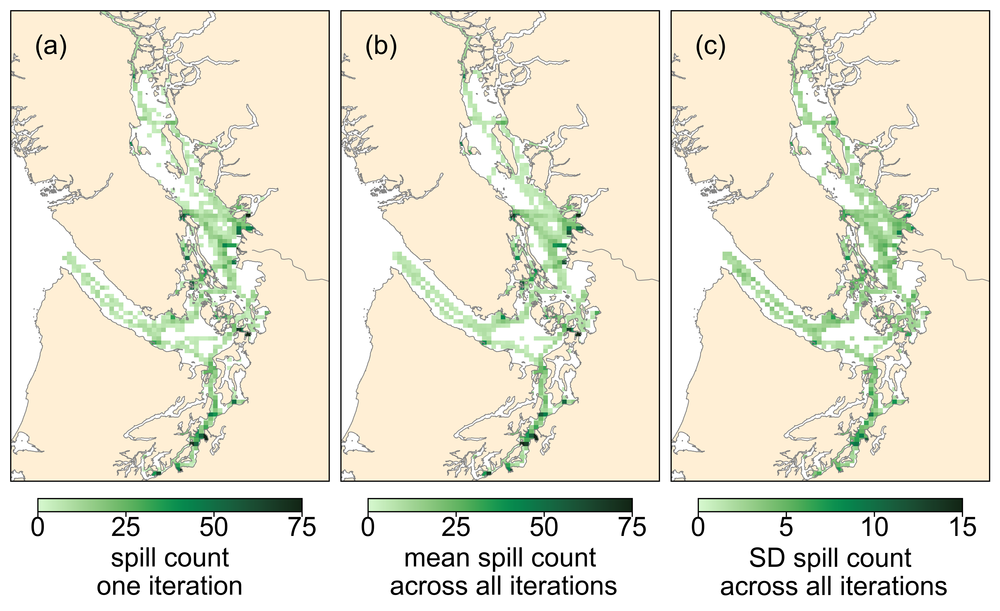

In [10]:
fig, axs = plt.subplots(1, 3, 
    figsize=(12, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1#, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1#, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()], crs=plain_crs)
    ax.set_aspect(1)

# do coordinate conversion of (x,y)
xynps = axs[0].projection.transform_points(
    plain_crs, 
    numpy.array(df[3].spill_lon), 
    numpy.array(df[3].spill_lat))

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);
r3_count[numpy.where(r3_count==0)] = numpy.nan 

# ~~~ Volume of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_vol,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1], 
    weights = df[3].spill_volume,
    bins=(nbins_x,nbins_y)
); 
r3_vol[numpy.where(r3_vol==0)] = numpy.nan 

# loop through runs and calculate the mean and standard deviation
for run in numpy.arange(len(df)):
    
    # do coordinate conversion of (x,y)
    xynps = axs[0].projection.transform_points(
        plain_crs,#crs.Geodetic(), 
        numpy.array(df[run].spill_lon), 
        numpy.array(df[run].spill_lat))

    # ~~~ Number of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    count_arr[run,:,:],xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1],
        bins=(nbins_x,nbins_y)
    );

    # ~~~ Volume of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    vol_arr[run,:,:],xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1], 
        weights = df[run].spill_volume,
        bins=(nbins_x,nbins_y)
    ); 

# assign values and set zero to NaN
mean_count = count_arr.mean(axis=0)
#mean_count[numpy.where(mean_count==0)] = numpy.nan

std_count = count_arr.std(axis=0)
#std_count[numpy.where(std_count==0)] = numpy.nan 

# set zero to NaN for white space
white_spaces_this = numpy.where(r3_count<4)
white_spaces_all = numpy.where(mean_count<4)
r3_count[white_spaces_this] = numpy.nan 
mean_count[white_spaces_all] = numpy.nan 
std_count[white_spaces_all] = numpy.nan 

# ~~~~~~ count graphics ~~~~~~~~~~~

C3_count=axs[0].pcolormesh(Xr, Yr, r3_count, 
    cmap=cmo.algae,
    vmin=0,
    vmax=75,
    zorder=0)
Cavg_count=axs[1].pcolormesh(Xr, Yr, mean_count, 
    cmap=cmo.algae,
    vmin=0,
    vmax=75,
    zorder=0)
Cstd_count=axs[2].pcolormesh(Xr, Yr, std_count, 
    cmap=cmo.algae,
    vmin=0,
    vmax=15,
    zorder=0)

# Add colorbars
cbar0=fig.colorbar(C3_count, 
    ax=axs[0], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='spill count\none iteration',
    ticks=[0,25,50,75],
    format=mpl.ticker.FixedFormatter(['0','25','50','75']))
cbar0=fig.colorbar(Cavg_count, 
    ax=axs[1], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='mean spill count\n across all iterations',
    ticks=[0,25,50,75],
    format=mpl.ticker.FixedFormatter(['0','25','50','75']) )
cbar0=fig.colorbar(Cstd_count, 
    ax=axs[2], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='SD spill count\n across all iterations',
    ticks=[0,5,10,15],
    format=mpl.ticker.FixedFormatter(['0','5','10','15']) )

# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2, frameon=False)
b_anchored = AnchoredText("(b)", loc=2, frameon=False)
c_anchored = AnchoredText("(c)", loc=2, frameon=False)

axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)
axs[2].add_artist(c_anchored)

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure7_3panel_SpillCount.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure7_3panel_SpillCount_small.png')

Figure 7: Spill density maps of (a) spill count for the 10,000 spills evaluated in the companion [Part 2 manuscript](https://www.sciencedirect.com/science/article/pii/S0025326X25008859), referred to as the Study spill set, (b) average spill density over nine iterations of 10,000 spills, (c) standard deviation (SD) of spill count across nine iterations of 10,000 spills. Only locations with greater than 3 spills are shown.

---
# Plot Part 1: Figure 9

---

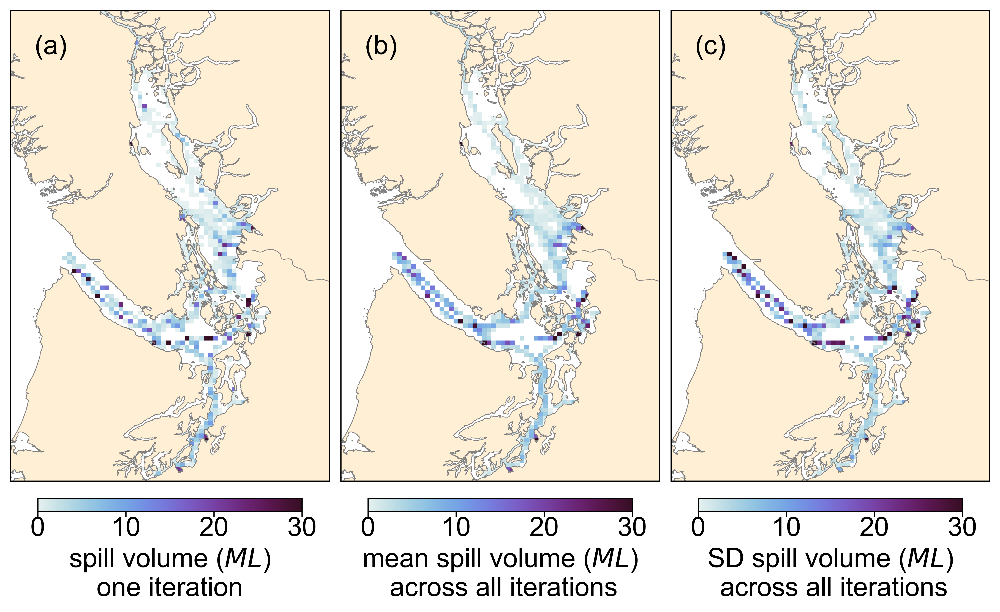

In [11]:
mean_vol = vol_arr.mean(axis=0)
std_vol = vol_arr.std(axis=0)

# assign values and set zero to NaN
r3_vol[white_spaces_this] = numpy.nan
mean_vol[white_spaces_all] = numpy.nan
std_vol[white_spaces_all] = numpy.nan 

# plot
fig, axs = plt.subplots(1, 3, 
    figsize=(12, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1#, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1#, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()], crs=plain_crs)
    ax.set_aspect(1)

# create meshgrid for combined plots    
xynps = axs[2].projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df_90K.spill_lon), 
    numpy.array(df_90K.spill_lat))

# ~~~~~~ volume graphics ~~~~~~~~~~~
C3_vol=axs[0].pcolormesh(Xr, Yr, r3_vol, 
    cmap=cmo.dense,
    vmin=0,
    vmax=3e7,
    zorder=0)
Cavg_vol=axs[1].pcolormesh(Xr, Yr, mean_vol, 
    cmap=cmo.dense,
    vmin=0,
    vmax=3e7,
    zorder=0)
Cstd_vol=axs[2].pcolormesh(Xr, Yr, std_vol, 
    cmap=cmo.dense,
    vmin=0,
    vmax=3e7,
    zorder=0)

# Add colorbars
cbar1=fig.colorbar(C3_vol, 
    ax=axs[0],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='spill volume ($ML$)\none iteration',
    ticks=[0,1e7,2e7,3e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30']) )
cbar1=fig.colorbar(Cavg_vol, 
    ax=axs[1],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='mean spill volume ($ML$)\n across all iterations',
    ticks=[0,1e7,2e7,3e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30']) )
cbar1=fig.colorbar(Cstd_vol, 
    ax=axs[2],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='SD spill volume ($ML$)\n across all iterations',
    ticks=[0,1e7,2e7,3e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30']) )


# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2, frameon=False)
b_anchored = AnchoredText("(b)", loc=2, frameon=False)
c_anchored = AnchoredText("(c)", loc=2, frameon=False)

axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)
axs[2].add_artist(c_anchored)

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure9_3panel_SpillVolume.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure9_3panel_SpillVolume_small.png')

Figure 9: A companion graphic to Figure 7 showing 2D histograms of spill volumes (a) for the 10,000 spills used as the Study spill set evaluated in the companion [Part 2 manuscript](https://www.sciencedirect.com/science/article/pii/S0025326X25008859), (b) averaged over nine iterations of 10,000 spills, (c) as a standard deviation (SD) of spill spill volume
histograms across nine iterations of 10,000 spills. Only locations with greater than 3 spills are shown.

---
## Plot Part 1: Figure 10 (in liters)

---


In [12]:
df_oils = {}
for oil_type in oil_types:
    print(oil_type)
    df_oils[oil_type]=df[3][df[3]['Lagrangian_template'].isin([oil_type,0])]

Bunker-C
Diesel
ANS
Dilbit


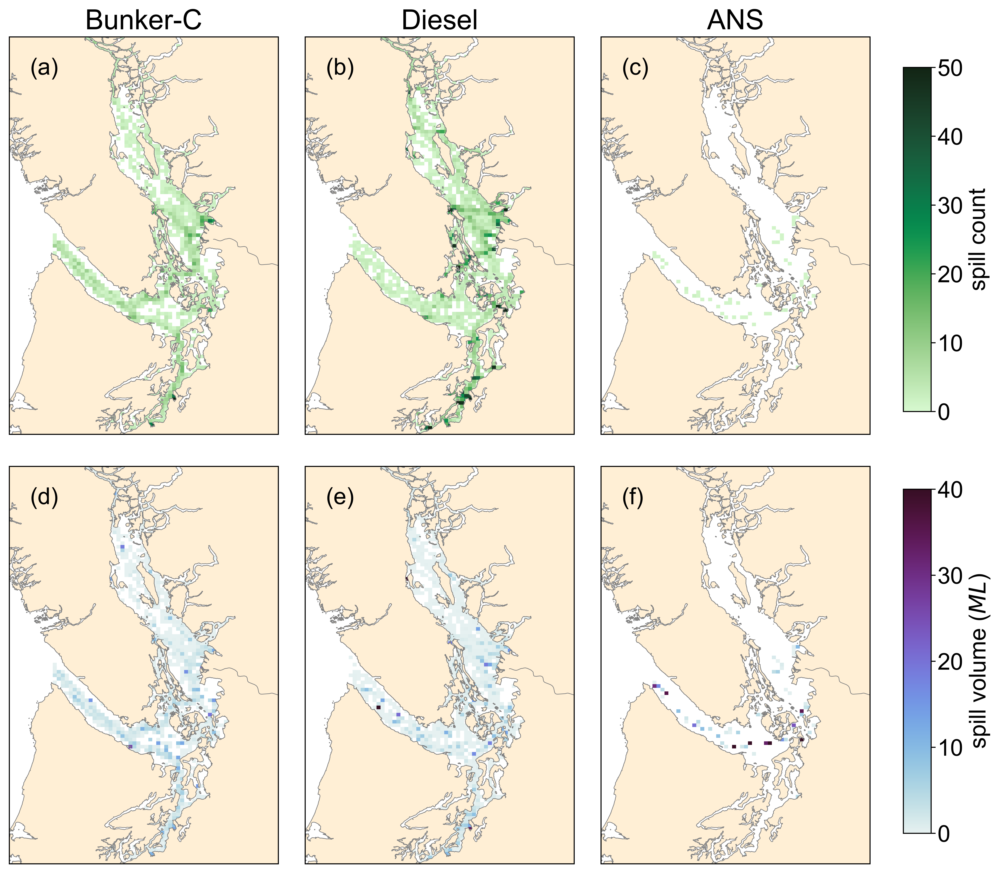

In [13]:
fig, axs = plt.subplots(2, 3, 
    figsize=(12, 12), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1,1],
       'wspace': 0.1,
       'hspace': 0.01}
)

for idy in [0,1]:
    for idx in [0,1,2]:
        axs[idy,idx].add_feature(feature.GSHHSFeature(
            'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
             zorder=1#, alpha=0.7
        ))
        axs[idy,idx].add_feature(feature.NaturalEarthFeature(
            category='physical', name='rivers_lake_centerlines',
            scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
            zorder=1#, alpha=0.7
        ))
        axs[idy,idx].set_extent([-124, -123.75, lat.min()-0.15, lat.max()], crs=plain_crs)
        axs[idy,idx].set_aspect(1)

for idx,oil in enumerate(oil_types[0:3]):

    # create meshgrid for combined plots    
    xynps = axs[0,idx].projection.transform_points(
        crs.Geodetic(), 
        numpy.array(df_oils[oil].spill_lon), 
        numpy.array(df_oils[oil].spill_lat))

    # ~~~ Number of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    spill_count,xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1],
        bins=(nbins_x,nbins_y)
    );
    spill_count[numpy.where(spill_count==0)] = numpy.nan 

    # ~~~ Volume of spills ~~~
    # calculate histograms for number of spills and plot using pcolormesh
    spill_vol,xe,ye = numpy.histogram2d(
        xynps[:,0], 
        xynps[:,1], 
        weights = df_oils[oil].spill_volume,
        bins=(nbins_x,nbins_y)
    ); 
    spill_vol[numpy.where(spill_vol==0)] = numpy.nan 

    C_count=axs[0,idx].pcolormesh(Xr, Yr, spill_count, 
        cmap=cmo.algae,
        vmin=0,
        vmax=50,
        zorder=0)
    C_vol=axs[1,idx].pcolormesh(Xr, Yr, spill_vol, 
        cmap=cmo.dense,
        vmin=0,
        vmax=4e7,
        zorder=0)

    axs[0,idx].set_title(oil);

    # Use anchored text to make location of subplot labels consistent between figures
    anchored_top = AnchoredText(label[idx], loc=2, frameon=False)
    anchored_bottom = AnchoredText(label[idx+3], loc=2, frameon=False)
    axs[0,idx].add_artist(anchored_top)
    axs[1, idx].add_artist(anchored_bottom)

# Add colorbars
cb_cnt_ax = fig.add_axes([.93,.53,.025,.31])
cb_vol_ax = fig.add_axes([.93,.15,.025,.31])
cbar0=fig.colorbar(C_count, 
    cax=cb_cnt_ax, 
    pad=0.03, shrink=0.8, 
    label='spill count',
    ticks=[0,10,20,30,40,50])
cbar1=fig.colorbar(C_vol, 
    cax=cb_vol_ax,  
    pad=0.03, shrink=0.8,
    label='spill volume ($ML$)',
    ticks=[0,1e7,2e7,3e7,4e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30','40']))

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure10_Count_Volume_byOil_thisStudy.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure10_Count_Volume_byOil_thisStudy_small.png')
  

Figure 10: 2D histograms of (a-c) spill count and (d-f) spill volume for the three oil classifications evaluated in the Study spill set, which are: (a,c) Bunker-C, (b,e) Diesel, and (c,f) ANS.

---
# Plot Part 1: Figure 11 (in liters)

---

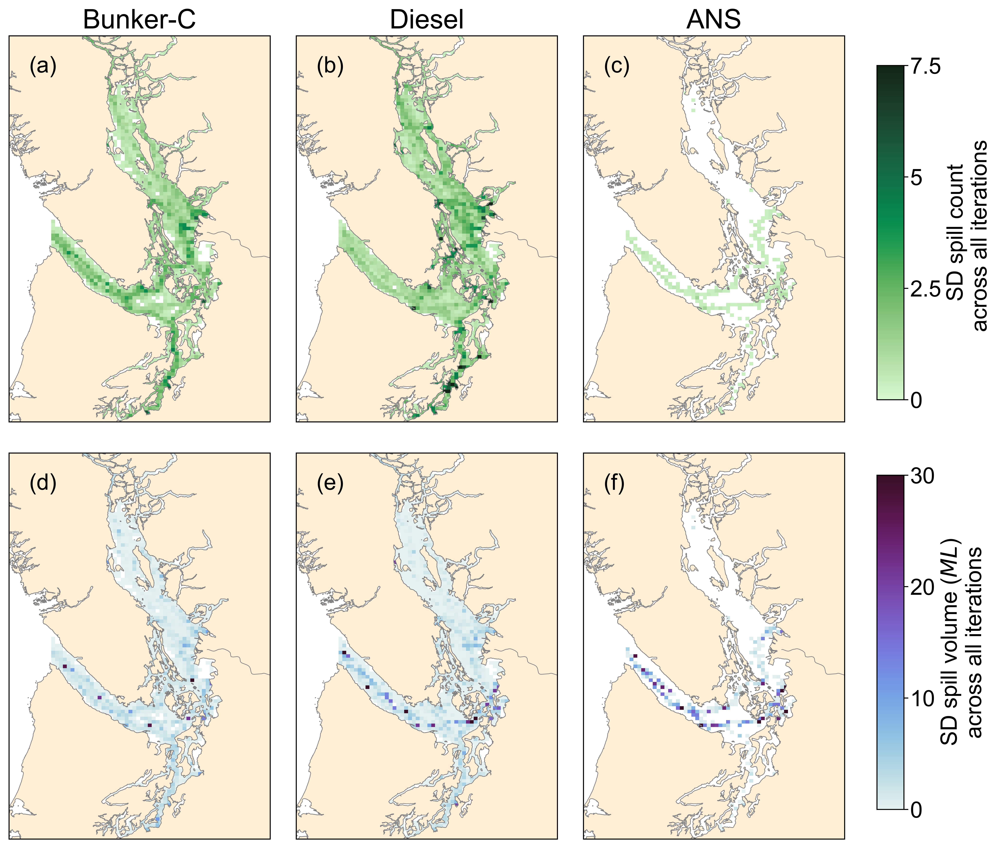

In [14]:
# initialize arrays of size N-iterations, N-oils, nx, ny
count_arr = numpy.empty((len(df), nbins_x, nbins_y))
vol_arr = numpy.empty((len(df), nbins_x, nbins_y))

fig, axs = plt.subplots(2, 3, 
    figsize=(12, 12), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1],
       'height_ratios': [1,1],
       'wspace': 0.1,
       'hspace': 0.01}
)

for idy in [0,1]:
    for idx in [0,1,2]:
        axs[idy,idx].add_feature(feature.GSHHSFeature(
            'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
             zorder=1#, alpha=0.7
        ))
        axs[idy,idx].add_feature(feature.NaturalEarthFeature(
            category='physical', name='rivers_lake_centerlines',
            scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
            zorder=1#, alpha=0.7
        ))
        axs[idy,idx].set_extent([-124, -123.75, lat.min()-0.15, lat.max()], crs=plain_crs)
        axs[idy,idx].set_aspect(1)

for idx,oil in enumerate(oil_types[0:3]):
     
    for run in numpy.arange(len(df)):
    
        # select spills for this oil type and iteration of 10,000 spills
        df_loop = df[run][df[run]['Lagrangian_template'].isin([oil,0])]
       
        # do coordinate conversion of (x,y)
        xynps = axs[0, idx].projection.transform_points(
            crs.Geodetic(), 
            numpy.array(df_loop.spill_lon), 
            numpy.array(df_loop.spill_lat)
        )

        # ~~~ Number of spills ~~~
        # calculate histograms for number of spills and plot using pcolormesh
        count_arr[run,:,:],xe,ye = numpy.histogram2d(
            xynps[:,0], 
            xynps[:,1],
            bins=(nbins_x,nbins_y)
        );


        # ~~~ Volume of spills ~~~
        # calculate histograms for number of spills and plot using pcolormesh
        vol_arr[run,:,:],xe,ye = numpy.histogram2d(
            xynps[:,0], 
            xynps[:,1], 
            weights = df_loop.spill_volume,
            bins=(nbins_x,nbins_y)
        ); 

    # calculate standard deviation by oil type
    std_count = count_arr.std(axis=0) 
    std_vol = vol_arr.std(axis=0)

    # set zero to NaN for graphical purposes
    std_count[numpy.where(std_count==0)] = numpy.nan 
    std_vol[numpy.where(std_vol==0)] = numpy.nan
    
    C_count=axs[0,idx].pcolormesh(Xr, Yr, std_count, 
        cmap=cmo.algae,
        vmin=0,
        vmax=7.5,
        zorder=0)
    C_vol=axs[1,idx].pcolormesh(Xr, Yr, std_vol, 
        cmap=cmo.dense,
        vmin=0,
        vmax=3e7,
        zorder=0)

    axs[0,idx].set_title(oil);

    # Use anchored text to make location of subplot labels consistent between figures
    anchored_top = AnchoredText(label[idx], loc=2, frameon=False)
    anchored_bottom = AnchoredText(label[idx+3], loc=2, frameon=False)
    axs[0,idx].add_artist(anchored_top)
    axs[1, idx].add_artist(anchored_bottom)

# Add colorbars
cb_cnt_ax = fig.add_axes([.93,.53,.025,.31])
cb_vol_ax = fig.add_axes([.93,.15,.025,.31])

cbar0=fig.colorbar(C_count, 
    cax=cb_cnt_ax, 
    pad=0.03, shrink=0.8, 
    label='SD spill count\nacross all iterations ',
    ticks=[0,2.5,5,7.5],
    format=mpl.ticker.FixedFormatter(['0','2.5','5','7.5']))
cbar1=fig.colorbar(C_vol, 
    cax=cb_vol_ax,  
    pad=0.03, shrink=0.8,
    label='SD spill volume ($ML$)\nacross all iterations',
    ticks=[0,1e7,2e7,3e7],
    format=mpl.ticker.FixedFormatter(['0','10','20','30']))

if custom_dpi>=600:
    plt.savefig(graphics_dir/'Part1_Figure11_Count_Volume_byOil_90K.png')
else:
    plt.savefig(graphics_dir/'Part1_Figure11_Count_Volume_byOil_90K_small.png')

Figure 11: Standard deviation of 2D histograms across all iterations of 10,000 spills for (a-c) spill count and (d-f) spill volume for the three oil classifications evaluated in this study: (a,c) Bunker-C, (b,e) Diesel, and (c,f) ANS.